## Limpieza de datos del dataset

Una vez se tiene el dataset que sera objeto de estudio, y antes de realizar ningún analisis de los datos, es necesario realizar la limpieza de los datos. 

Importamos las librerias que serán secesarias tanto para la limpieza como para el Análisis exploratorio.


In [2]:
# data manipulation
import pandas as pd
import numpy as np

# data viz
import matplotlib.pyplot as plt
from matplotlib import rcParams
import seaborn as sns

# aplicamos algunas reglas de estilo para la visualización
plt.style.use("ggplot")
rcParams['figure.figsize'] = (12, 6)

Cargamos nuestro dataset y analizamos ciertos datos de interes que nos van a permitir conocer mejor los datos de los que disponemos.

In [3]:
df_result_poblacion_economico_idealista_inversiones_locales =  pd.read_csv('datos/silver/result_datos_poblacion_economicos_idealista_inversiones_locales.csv', decimal=',', delimiter=';',header=0)

Mostramos el tamaño del dataset con la función shape. 

In [4]:
df_result_poblacion_economico_idealista_inversiones_locales.shape

(2310, 32)

Esta función nos indica que disponemos de 2310 filas y 32 columnas. Vamos a obtener información con la funcion info:

In [5]:
df_result_poblacion_economico_idealista_inversiones_locales.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2310 entries, 0 to 2309
Data columns (total 32 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Anio                               2310 non-null   int64  
 1   Periodo                            2309 non-null   object 
 2   CodigoDistrito                     2309 non-null   float64
 3   NombreDistrito                     2309 non-null   object 
 4   CodigoBarrio                       2309 non-null   object 
 5   NombreBarrio                       2309 non-null   object 
 6   DatoPoblacion                      2309 non-null   object 
 7   DatoPoblacionMenor16               2309 non-null   object 
 8   DatoPoblacionEntre16y64            2309 non-null   object 
 9   DatoPoblacionMayor65               2309 non-null   object 
 10  DatoSobreEnvejecimiento            2309 non-null   object 
 11  DatoSobreenvejecimientoHombres     2309 non-null   objec

Es importante, en este punto, destacar que no existe ninguna columna repretida o que semanticamente tenga pueda tener el mismo significado. Además, debido a que el dataset se ha preparado con datos disponibles, podemos garantizar que todas las variables son utiles y tiene un sentido que se utilicen para posteriores estudios. Por eso se va a mantener el conjunto de columnas completo.

Los nombres de las variables son descriptivos por lo que tambien se mantienen.

A continuación, una vez comprobadas las columnas, pasamos a comprobar que no exista ninguna fila duplicada.

In [6]:
df_result_poblacion_economico_idealista_inversiones_locales.duplicated().sum()

0

Se puede ver que no exste ninguna fila duplicada por lo que no es necesario borrar ninguna fila.

Para comprobar que campos contienen valores nulos utilizamos la función describe.

In [7]:
df_result_poblacion_economico_idealista_inversiones_locales.isna().sum()

Anio                                    0
Periodo                                 1
CodigoDistrito                          1
NombreDistrito                          1
CodigoBarrio                            1
NombreBarrio                            1
DatoPoblacion                           1
DatoPoblacionMenor16                    1
DatoPoblacionEntre16y64                 1
DatoPoblacionMayor65                    1
DatoSobreEnvejecimiento                 1
DatoSobreenvejecimientoHombres          1
DatoSobreenvejecimientoMujeres          1
DatoFeminidad                           1
DatoParadosRegistrados                904
DatoParadosRegistradosHombres         890
DatoParadosRegistradosMujer           890
DatoAfiliacionesTrabajo               636
DatoAfiliacionesTrabajoHombres        636
DatoAfiliacionesTrabajoMujer          636
DatoAfiliacionesResidencia           1022
DatoAfiliacionesResidenciaHombres    1028
DatoAfiliacionesResidenciaMujer      1028
DatoAutonomo                      

En este caso se tiene bastantes filas que contienen valores nulos en alguna de sus columnas. Como se explica anteriormente todos estos valores nulos provienen de los merge realizados con el metodo "outer" debido a que se cruzan periodos que no existen en todos los dataset o al hacer el cruce por distrito en lugar de barrio. Por esto tomamos la decisión de, de inicio, mantener todos los valores nulos. Posteriormente, segun sea necesario, se haran los filtrados necesarios para los analisis que lo necesiten.

Se ha detectado que en las columnas DatoParadosRegistradosHombres y DatoParadosRegistradosMujer existen algunos registros que contienen el caracter '-'. Esto supone un problema debido a que cuando sea necesario tratar las variables como numericas python no será capaz de transformar esos regisros a numericos. Se decide, por tanto, sustituir dichos valores por un valor nulo o NaN

In [8]:
df_result_poblacion_economico_idealista_inversiones_locales.loc[df_result_poblacion_economico_idealista_inversiones_locales.DatoParadosRegistradosHombres==' - ','DatoParadosRegistradosHombres']=np.NaN
df_result_poblacion_economico_idealista_inversiones_locales.loc[df_result_poblacion_economico_idealista_inversiones_locales.DatoParadosRegistradosMujer==' - ','DatoParadosRegistradosMujer']=np.NaN

## Análisis Exploratorio de los Datos

Una vez se ha realizado una limpieza de los datos, es el momento de realizar un analsis exploratorio completo de nuestras variables. De esta manera es posible tener un conocimiento del dataset. Para ello se comienza diferenciando las variables categoricas de las variables numericas o cuantitativas.

Entre las variables categoricas se pueden encontrar las siguiente:

    - Anio
    - Periodo
    - CodigoDistrito
    - NombreDistrito
    - CodigoBarrio
    - NombreBarrio

Mientras el resto de variables son variables cuantitativas. Son las siguientes:

    - DatoPoblacion
    - DatoPoblacionMenor16
    - DatoPoblacionEntre16y64
    - DatoPoblacionMayor65
    - DatoSobreEnvejecimiento
    - DatoSobreenvejecimientoHombres
    - DatoSobreenvejecimientoMujeres
    - DatoFeminidad
    - DatoParadosRegistrados
    - DatoParadosRegistradosHombres
    - DatoParadosRegistradosMujer
    - DatoAfiliacionesTrabajo
    - DatoAfiliacionesTrabajoHombres
    - DatoAfiliacionesTrabajoMujer
    - DatoAfiliacionesResidencia
    - DatoAfiliacionesResidenciaHombres
    - DatoAfiliacionesResidenciaMujer
    - DatoAutonomo
    - DatoAutonomosHombres
    - DatoAutonomosMujer
    - PrecioVentaEurosM2
    - PrecioAlquilerEurosM2
    - PresupuestoGasto
    - Gasto_Real
    - NumeroLocales
    - NumeroAlojamientos

A continuacion se realiza el estudio de las variables categoricas y se continua con las cuantitativas:

### Variables categoricas:

#### Anio:
Comprobamos el número de valores diferentes que tenemos en la variable con la función .value_counts().


In [9]:
df_result_poblacion_economico_idealista_inversiones_locales["Anio"].value_counts()

2017    131
2019    131
2020    131
2021    131
2022    131
2018    131
2011    127
2016    127
2015    127
2013    127
2012    127
2008    127
2010    127
2009    127
2007    127
2006    127
2005    127
2014    126
0         1
Name: Anio, dtype: int64

Ademas, se puede expresar el resultado en porcentaje utilizando el parametro "normalize=True".

In [10]:
df_result_poblacion_economico_idealista_inversiones_locales["Anio"].value_counts(normalize=True)

2017    0.056710
2019    0.056710
2020    0.056710
2021    0.056710
2022    0.056710
2018    0.056710
2011    0.054978
2016    0.054978
2015    0.054978
2013    0.054978
2012    0.054978
2008    0.054978
2010    0.054978
2009    0.054978
2007    0.054978
2006    0.054978
2005    0.054978
2014    0.054545
0       0.000433
Name: Anio, dtype: float64

Lo primero que se observa es que no todos los años tienen datos, lo cual se debe tener en cuenta en posteriores estudios, y, ademas, existe una entrada para anio = '0' que no debe existir. Se procede a borrarla.

In [11]:
df_result_poblacion_economico_idealista_inversiones_locales = df_result_poblacion_economico_idealista_inversiones_locales.drop(
                            df_result_poblacion_economico_idealista_inversiones_locales[(df_result_poblacion_economico_idealista_inversiones_locales['Anio'] == 0)].index
                        )
df_result_poblacion_economico_idealista_inversiones_locales["Anio"].value_counts(normalize=True)

2017    0.056735
2019    0.056735
2020    0.056735
2021    0.056735
2022    0.056735
2018    0.056735
2010    0.055002
2015    0.055002
2013    0.055002
2012    0.055002
2011    0.055002
2008    0.055002
2009    0.055002
2007    0.055002
2006    0.055002
2005    0.055002
2016    0.055002
2014    0.054569
Name: Anio, dtype: float64

Se obtiene una representación gráfica de los datos.

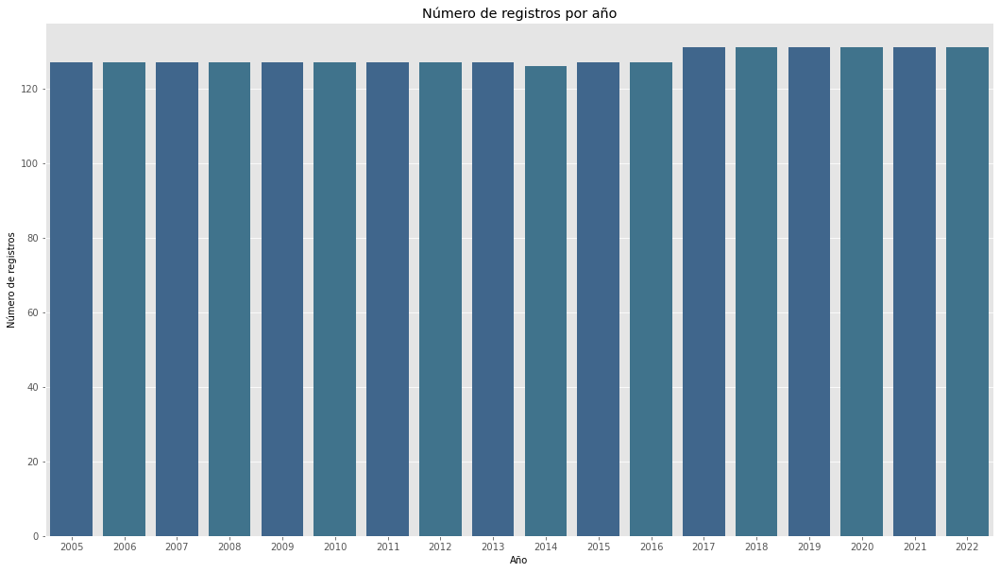

In [12]:
plt.figure(figsize=(18,10))
fig = sns.countplot(x = 'Anio', data = df_result_poblacion_economico_idealista_inversiones_locales, palette=["#336699","#337799"])

plt.xlabel("Año")
plt.ylabel("Número de registros")
plt.title("Número de registros por año")

plt.show(fig)

#### Periodo
Se realiza el mismo analisis que para la variable anterior

In [13]:
df_result_poblacion_economico_idealista_inversiones_locales["Periodo"].value_counts()

Anual    2309
Name: Periodo, dtype: int64

Como se puede observar todos los registros contienen el valor "Anual". En este caso esta variable no aporta información puesto que todos los regsitros contienen el mismo valor. Esta variable, por tanto, no será utilizada en los futuros estudios.

#### CodigoDistrito
Se realiza el mismo analisis que anteriormente.

In [14]:
df_result_poblacion_economico_idealista_inversiones_locales["CodigoDistrito"].value_counts()

15.0    162
20.0    144
8.0     144
2.0     126
12.0    126
10.0    126
9.0     126
11.0    126
1.0     108
14.0    108
3.0     108
4.0     108
7.0     108
6.0     108
5.0     108
16.0    108
13.0    107
17.0     90
21.0     90
18.0     42
19.0     36
Name: CodigoDistrito, dtype: int64

Se obtienen, de igual manera, los valores porcentuales. 

In [15]:
df_result_poblacion_economico_idealista_inversiones_locales["CodigoDistrito"].value_counts(normalize=True)

15.0    0.070160
20.0    0.062365
8.0     0.062365
2.0     0.054569
12.0    0.054569
10.0    0.054569
9.0     0.054569
11.0    0.054569
1.0     0.046773
14.0    0.046773
3.0     0.046773
4.0     0.046773
7.0     0.046773
6.0     0.046773
5.0     0.046773
16.0    0.046773
13.0    0.046340
17.0    0.038978
21.0    0.038978
18.0    0.018190
19.0    0.015591
Name: CodigoDistrito, dtype: float64

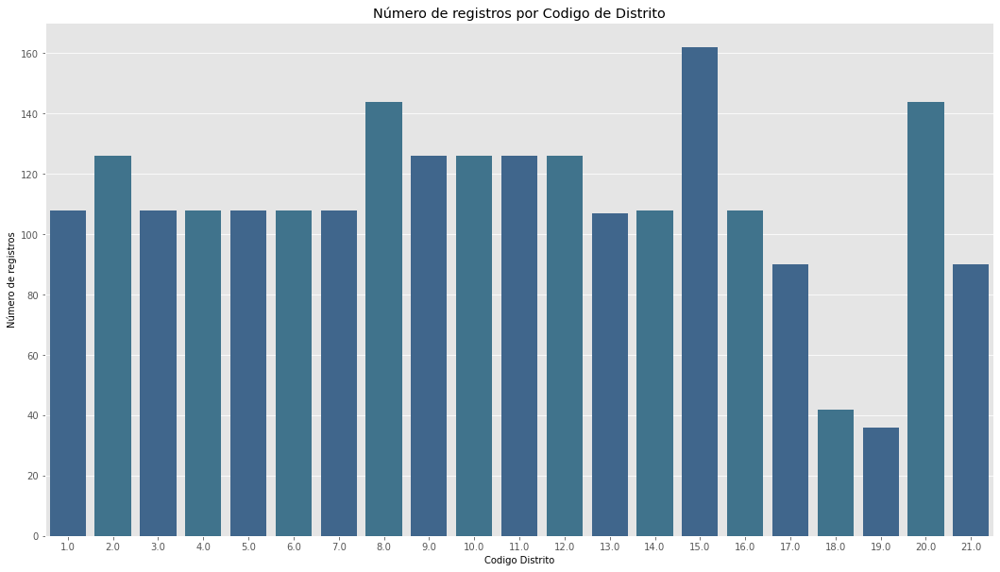

In [16]:
plt.figure(figsize=(18,10))
fig = sns.countplot(x = 'CodigoDistrito', data = df_result_poblacion_economico_idealista_inversiones_locales, palette=["#336699","#337799"])

plt.xlabel("Codigo Distrito")
plt.ylabel("Número de registros")
plt.title("Número de registros por Codigo de Distrito")

plt.show(fig)

#### NombreDistrito

Se realiza el mismo analisis para NombreDistrito

In [17]:
df_result_poblacion_economico_idealista_inversiones_locales["NombreDistrito"].value_counts()

Ciudad Lineal            162
San Blas - Canillejas    144
Fuencarral - El Pardo    144
Arganzuela               126
Usera                    126
Latina                   126
Moncloa - Aravaca        126
Carabanchel              126
Centro                   108
Moratalaz                108
Retiro                   108
Salamanca                108
Chamberí                 108
Tetuán                   108
Chamartín                108
Hortaleza                108
Puente de Vallecas       107
Villaverde                90
Barajas                   90
Villa de Vallecas         42
Vicálvaro                 36
Name: NombreDistrito, dtype: int64

In [18]:
df_result_poblacion_economico_idealista_inversiones_locales["NombreDistrito"].value_counts(normalize=True)

Ciudad Lineal            0.070160
San Blas - Canillejas    0.062365
Fuencarral - El Pardo    0.062365
Arganzuela               0.054569
Usera                    0.054569
Latina                   0.054569
Moncloa - Aravaca        0.054569
Carabanchel              0.054569
Centro                   0.046773
Moratalaz                0.046773
Retiro                   0.046773
Salamanca                0.046773
Chamberí                 0.046773
Tetuán                   0.046773
Chamartín                0.046773
Hortaleza                0.046773
Puente de Vallecas       0.046340
Villaverde               0.038978
Barajas                  0.038978
Villa de Vallecas        0.018190
Vicálvaro                0.015591
Name: NombreDistrito, dtype: float64

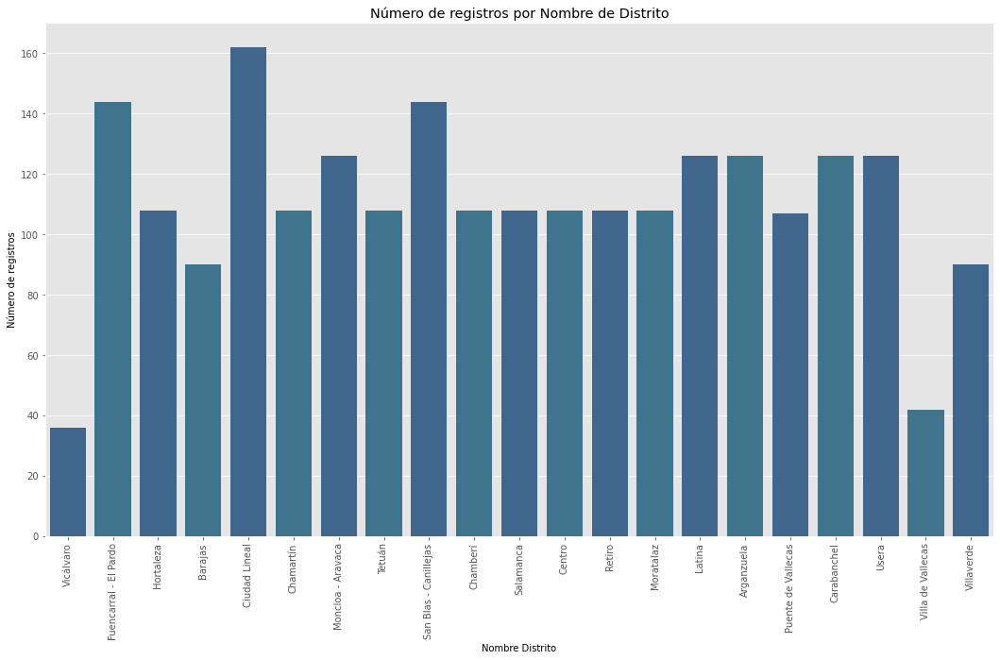

In [19]:
plt.figure(figsize=(18,10))
fig = sns.countplot(x = 'NombreDistrito', data = df_result_poblacion_economico_idealista_inversiones_locales, 
                    palette=["#336699","#337799"])

plt.xlabel("Nombre Distrito")
plt.ylabel("Número de registros")
plt.title("Número de registros por Nombre de Distrito")
plt.xticks(rotation=90)
plt.show(fig)

#### CodigoBarrio

In [20]:
df_result_poblacion_economico_idealista_inversiones_locales["CodigoBarrio"].value_counts()

44.0     18
191.0    18
106.0    18
107.0    18
105.0    18
         ..
136.0    17
183.0     6
193.0     6
192.0     6
194.0     6
Name: CodigoBarrio, Length: 131, dtype: int64

In [21]:
df_result_poblacion_economico_idealista_inversiones_locales["CodigoBarrio"].value_counts(normalize=True)

44.0     0.007796
191.0    0.007796
106.0    0.007796
107.0    0.007796
105.0    0.007796
           ...   
136.0    0.007362
183.0    0.002599
193.0    0.002599
192.0    0.002599
194.0    0.002599
Name: CodigoBarrio, Length: 131, dtype: float64

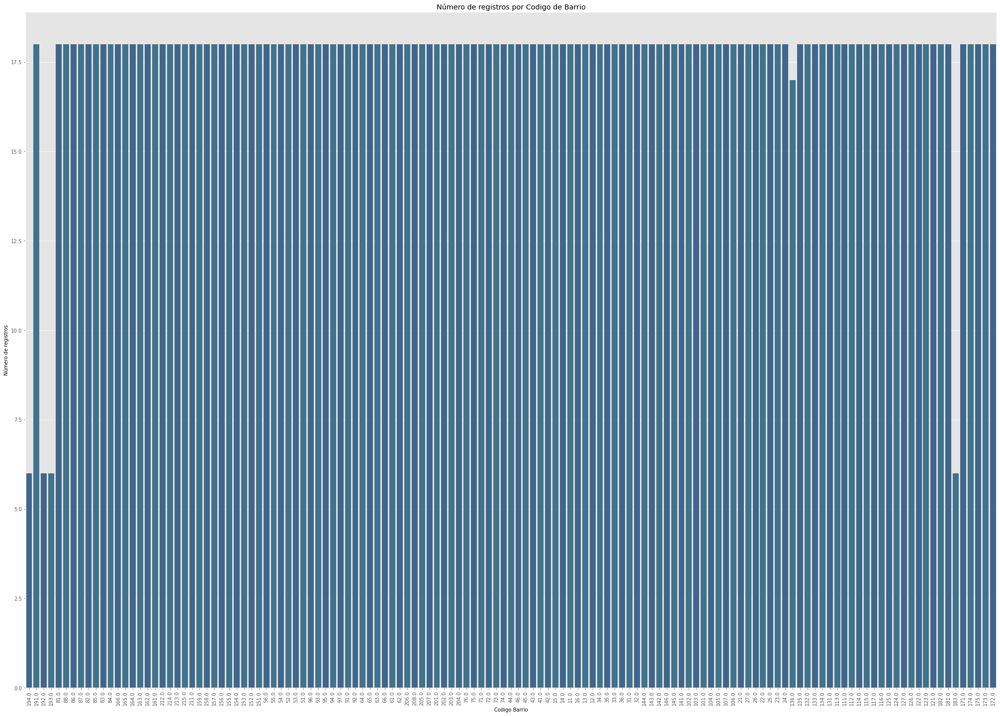

In [22]:
plt.figure(figsize=(35,25))
fig = sns.countplot(x = 'CodigoBarrio', data = df_result_poblacion_economico_idealista_inversiones_locales, 
                    palette=["#336699","#337799"])

plt.xlabel("Codigo Barrio")
plt.ylabel("Número de registros")
plt.title("Número de registros por Codigo de Barrio")
plt.xticks(rotation=90)
plt.show(fig)

#### NombreBarrio

In [23]:
df_result_poblacion_economico_idealista_inversiones_locales["NombreBarrio"].value_counts()

Guindalera                      18
Casco histórico de Vicálvaro    18
Cuatro Vientos                  18
Águilas                         18
Campamento                      18
                                ..
Numancia                        17
Ensanche de Vallecas             6
Valderrivas                      6
Valdebernardo                    6
El Cañaveral                     6
Name: NombreBarrio, Length: 131, dtype: int64

In [24]:
df_result_poblacion_economico_idealista_inversiones_locales["NombreBarrio"].value_counts(normalize=True)

Guindalera                      0.007796
Casco histórico de Vicálvaro    0.007796
Cuatro Vientos                  0.007796
Águilas                         0.007796
Campamento                      0.007796
                                  ...   
Numancia                        0.007362
Ensanche de Vallecas            0.002599
Valderrivas                     0.002599
Valdebernardo                   0.002599
El Cañaveral                    0.002599
Name: NombreBarrio, Length: 131, dtype: float64

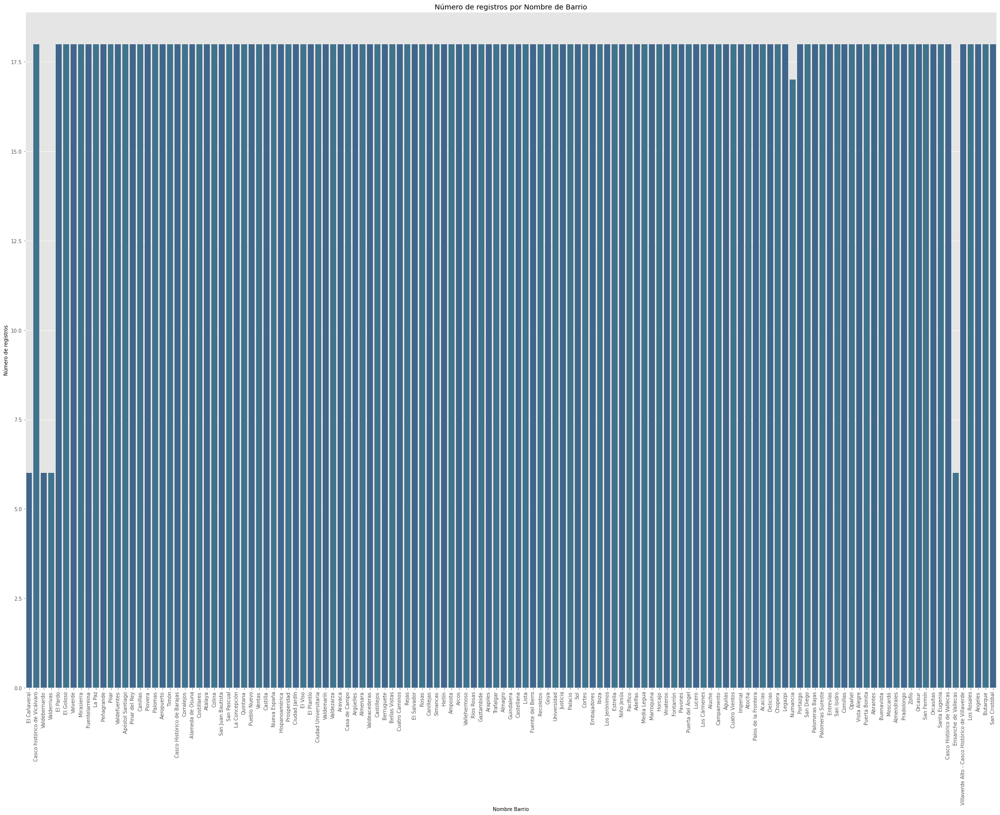

In [25]:
plt.figure(figsize=(35,25))
fig = sns.countplot(x = 'NombreBarrio', data = df_result_poblacion_economico_idealista_inversiones_locales, 
                    palette=["#336699","#337799"])

plt.xlabel("Nombre Barrio")
plt.ylabel("Número de registros")
plt.title("Número de registros por Nombre de Barrio")
plt.xticks(rotation=90)
plt.show(fig)

En este caso, se puede ver, que en casi todos los barrios se tiene el mismo número de registros menos en algunos casos. En estos barrios se puede dar la circustancia que el barrio sea de reciente creación o simplemente que no se dispone del dato para ese año.

## Variable cuantitativas o numéricas

A contnuación se realiza un estudio de las diferentes variables cuantitativas de las que disponemos. De todas ellas, se va a presentar una descripción con los estadisticos basicos, se representará su distribucion medianta un histograma y se calculará el valor de la Kurtosis y Skewness para interpretar la normalidad de la distribución. Por ultimo, se representara el gráfico boxplot y homologo grafico de violín.

#### DatoPoblacion

In [26]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoPoblacion = df_result_poblacion_economico_idealista_inversiones_locales.DatoPoblacion.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoPoblacion.describe()

count     2309.000000
mean     25054.515808
std      14230.177918
min          0.000000
25%      15989.000000
50%      22954.000000
75%      33541.000000
max      80292.000000
Name: DatoPoblacion, dtype: float64

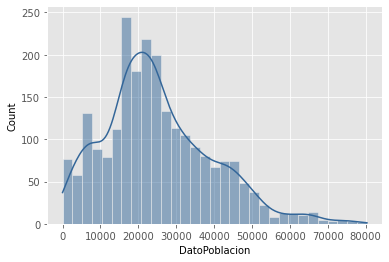

In [27]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoPoblacion", kde=True,  color="#336699")
plt.show()

In [28]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoPoblacion'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoPoblacion'].kurt()}")

Skewness: 0.7092594902827972
Kurtosis: 0.481996439753968


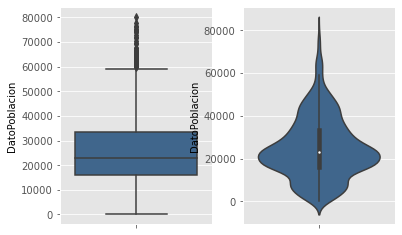

In [29]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoPoblacion",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoPoblacion", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

##### DatoPoblacionMenor16

In [30]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoPoblacionMenor16 = df_result_poblacion_economico_idealista_inversiones_locales.DatoPoblacionMenor16.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoPoblacionMenor16.describe()

count    2309.00000
mean       14.49369
std         4.49361
min         0.00000
25%        11.55000
50%        13.08000
75%        16.20000
max        33.52000
Name: DatoPoblacionMenor16, dtype: float64

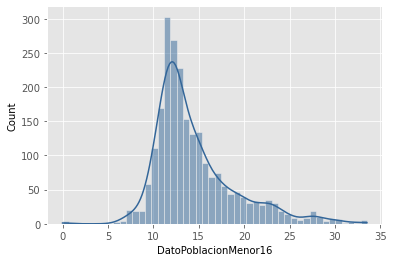

In [31]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoPoblacionMenor16", kde=True,  color="#336699")
plt.show()

In [32]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoPoblacionMenor16'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoPoblacionMenor16'].kurt()}")

Skewness: 1.3403080198142396
Kurtosis: 2.1148040888225172


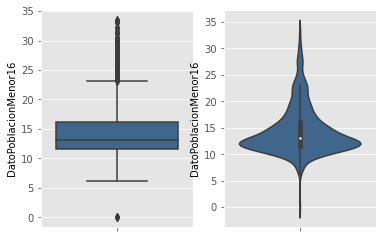

In [33]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoPoblacionMenor16",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoPoblacionMenor16", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoPoblacionEntre16y64

In [34]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoPoblacionEntre16y64 = df_result_poblacion_economico_idealista_inversiones_locales.DatoPoblacionEntre16y64.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoPoblacionEntre16y64.describe()

count    2309.000000
mean       66.118081
std         4.734791
min         0.000000
25%        64.050000
50%        66.180000
75%        68.360000
max        78.480000
Name: DatoPoblacionEntre16y64, dtype: float64

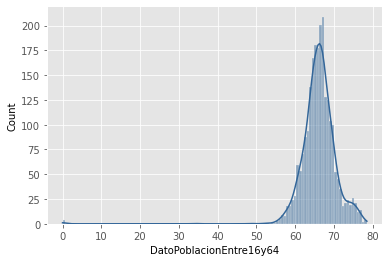

In [35]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoPoblacionEntre16y64", kde=True,  color="#336699")
plt.show()

In [36]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoPoblacionEntre16y64'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoPoblacionEntre16y64'].kurt()}")

Skewness: -4.707331909403442
Kurtosis: 65.55852302629361


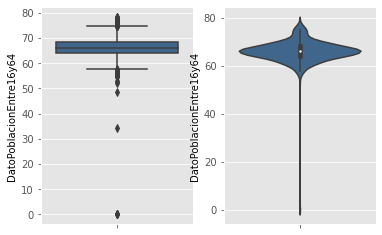

In [37]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoPoblacionEntre16y64",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoPoblacionEntre16y64", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoPoblacionMayor65

In [38]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoPoblacionMayor65 = df_result_poblacion_economico_idealista_inversiones_locales.DatoPoblacionMayor65.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoPoblacionMayor65.describe()

count    2309.000000
mean       19.214396
std         5.763854
min         0.000000
25%        16.110000
50%        19.990000
75%        23.270000
max        55.390000
Name: DatoPoblacionMayor65, dtype: float64

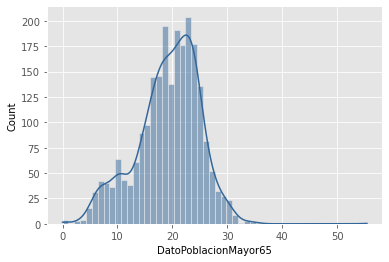

In [39]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoPoblacionMayor65", kde=True,  color="#336699")
plt.show()

In [40]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoPoblacionMayor65'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoPoblacionMayor65'].kurt()}")

Skewness: -0.41669263240858656
Kurtosis: 0.6423711552979561


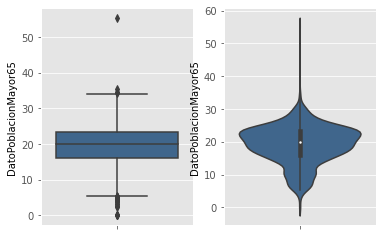

In [41]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoPoblacionMayor65",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoPoblacionMayor65", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoSobreEnvejecimiento

In [42]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoSobreEnvejecimiento = df_result_poblacion_economico_idealista_inversiones_locales.DatoSobreEnvejecimiento.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoSobreEnvejecimiento.describe()

count    2309.000000
mean       32.582434
std         7.564258
min         0.000000
25%        27.110000
50%        33.290000
75%        37.570000
max        68.400000
Name: DatoSobreEnvejecimiento, dtype: float64

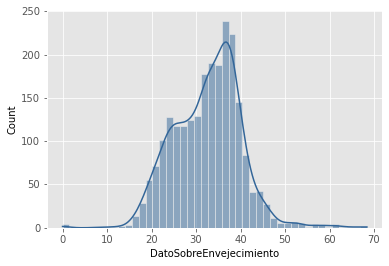

In [43]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoSobreEnvejecimiento", kde=True,  color="#336699")
plt.show()

In [44]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoSobreEnvejecimiento'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoSobreEnvejecimiento'].kurt()}")

Skewness: 0.10610548857483258
Kurtosis: 1.2753156206051766


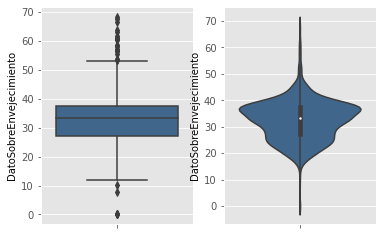

In [45]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoSobreEnvejecimiento",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoSobreEnvejecimiento", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoSobreenvejecimientoHombres

In [46]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoSobreenvejecimientoHombres = df_result_poblacion_economico_idealista_inversiones_locales.DatoSobreenvejecimientoHombres.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoSobreenvejecimientoHombres.describe()

count    2309.000000
mean       27.784279
std         7.143115
min         0.000000
25%        22.700000
50%        28.300000
75%        32.400000
max        55.600000
Name: DatoSobreenvejecimientoHombres, dtype: float64

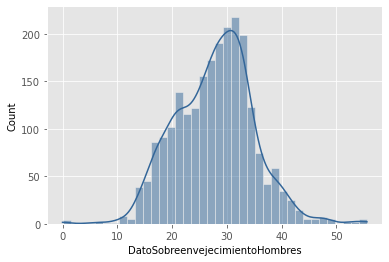

In [47]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoSobreenvejecimientoHombres", kde=True,  color="#336699")
plt.show()

In [48]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoSobreenvejecimientoHombres'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoSobreenvejecimientoHombres'].kurt()}")

Skewness: 0.06440076653050743
Kurtosis: 0.5710164740638719


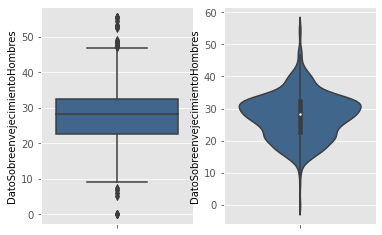

In [49]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoSobreenvejecimientoHombres",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoSobreenvejecimientoHombres", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoSobreenvejecimientoMujeres

In [50]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoSobreenvejecimientoMujeres = df_result_poblacion_economico_idealista_inversiones_locales.DatoSobreenvejecimientoMujeres.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoSobreenvejecimientoMujeres.describe()

count    2309.00000
mean       35.62278
std         7.95810
min         0.00000
25%        29.70000
50%        36.30000
75%        40.90000
max        75.00000
Name: DatoSobreenvejecimientoMujeres, dtype: float64

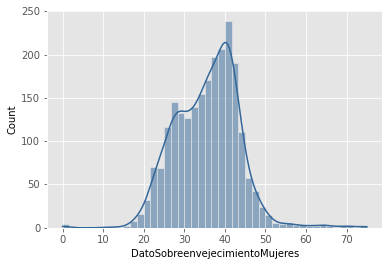

In [51]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoSobreenvejecimientoMujeres", kde=True,  color="#336699")
plt.show()

In [52]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoSobreenvejecimientoMujeres'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoSobreenvejecimientoMujeres'].kurt()}")

Skewness: 0.23025977963615593
Kurtosis: 1.8460493046401116


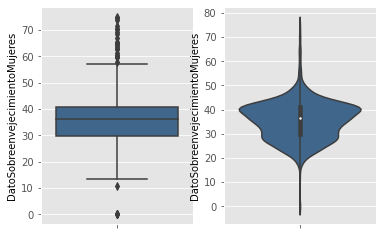

In [53]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoSobreenvejecimientoMujeres",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoSobreenvejecimientoMujeres", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoFeminidad

In [54]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoFeminidad = df_result_poblacion_economico_idealista_inversiones_locales.DatoFeminidad.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoFeminidad.describe()

count    2309.000000
mean      114.082027
std        10.008317
min         0.000000
25%       107.900000
50%       113.800000
75%       120.300000
max       145.100000
Name: DatoFeminidad, dtype: float64

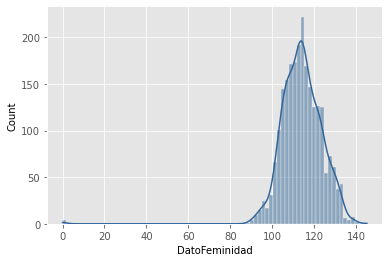

In [55]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoFeminidad", kde=True,  color="#336699")
plt.show()

In [56]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoFeminidad'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoFeminidad'].kurt()}")

Skewness: -2.422045341931441
Kurtosis: 28.021444175178857


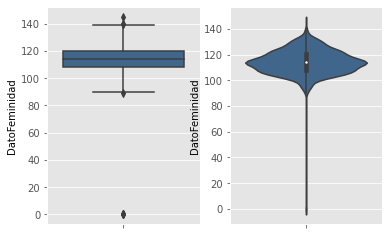

In [57]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoFeminidad",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoFeminidad", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

##### DatoParadosRegistrados

In [58]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoParadosRegistrados = df_result_poblacion_economico_idealista_inversiones_locales.DatoParadosRegistrados.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoParadosRegistrados.describe()

count    1406.000000
mean     1447.303698
std      1095.508738
min        33.000000
25%       641.000000
50%      1175.000000
75%      2010.250000
max      7312.000000
Name: DatoParadosRegistrados, dtype: float64

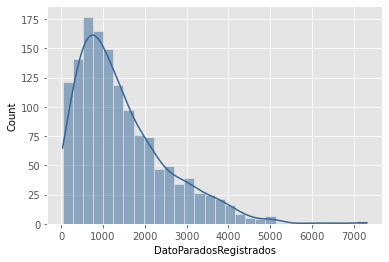

In [59]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoParadosRegistrados", kde=True,  color="#336699")
plt.show()

In [60]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoParadosRegistrados'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoParadosRegistrados'].kurt()}")

Skewness: 1.2924482465163731
Kurtosis: 2.1114102829554504


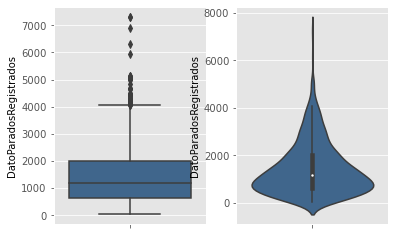

In [61]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoParadosRegistrados",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoParadosRegistrados", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoParadosRegistradosHombres

In [62]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoParadosRegistradosHombres = df_result_poblacion_economico_idealista_inversiones_locales.DatoParadosRegistradosHombres.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoParadosRegistradosHombres.describe()

count    1406.000000
mean      341.710139
std       290.983264
min         1.002000
25%        38.000000
50%       310.000000
75%       556.750000
max       999.000000
Name: DatoParadosRegistradosHombres, dtype: float64

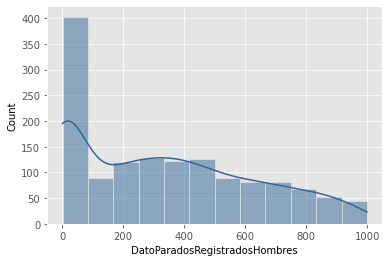

In [63]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoParadosRegistradosHombres", kde=True,  color="#336699")
plt.show()

In [64]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoParadosRegistradosHombres'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoParadosRegistradosHombres'].kurt()}")

Skewness: 0.45276445065593196
Kurtosis: -0.9218114167016398


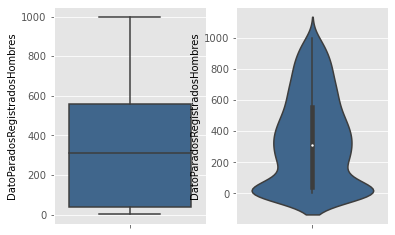

In [65]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoParadosRegistradosHombres",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoParadosRegistradosHombres", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoParadosRegistradosMujer

In [66]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoParadosRegistradosMujer = df_result_poblacion_economico_idealista_inversiones_locales.DatoParadosRegistradosMujer.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoParadosRegistradosMujer.describe()

count    1406.000000
mean      350.252928
std       310.027119
min         1.000000
25%         1.968500
50%       318.500000
75%       604.000000
max       998.000000
Name: DatoParadosRegistradosMujer, dtype: float64

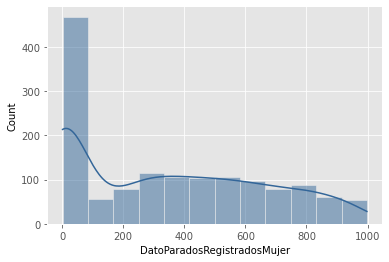

In [67]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoParadosRegistradosMujer", kde=True,  color="#336699")
plt.show()

In [68]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoParadosRegistradosMujer'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoParadosRegistradosMujer'].kurt()}")

Skewness: 0.35938819596970867
Kurtosis: -1.1592886576138441


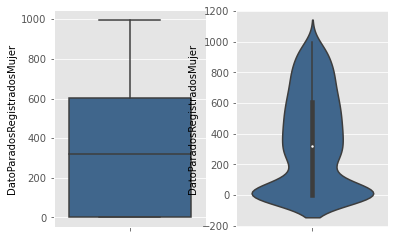

In [69]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoParadosRegistradosMujer",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoParadosRegistradosMujer", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoAfiliacionesTrabajo

In [70]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesTrabajo = df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesTrabajo.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesTrabajo.describe()

count      1674.000000
mean      12799.309438
std       14461.989110
min           0.000000
25%        3380.000000
50%        7212.500000
75%       17290.750000
max      121127.000000
Name: DatoAfiliacionesTrabajo, dtype: float64

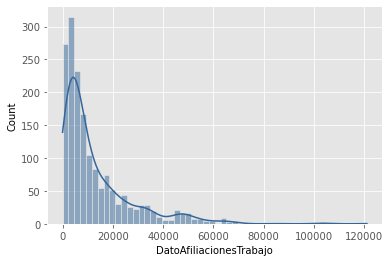

In [71]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoAfiliacionesTrabajo", kde=True,  color="#336699")
plt.show()

In [72]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAfiliacionesTrabajo'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAfiliacionesTrabajo'].kurt()}")

Skewness: 2.1961825721282473
Kurtosis: 6.522015904911691


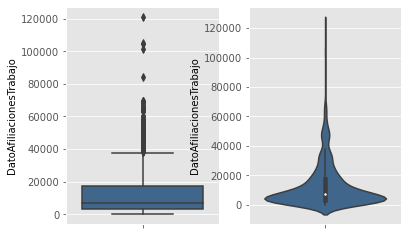

In [73]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoAfiliacionesTrabajo",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoAfiliacionesTrabajo", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoAfiliacionesTrabajoHombres

In [74]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesTrabajoHombres = df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesTrabajoHombres.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesTrabajoHombres.describe()

count    1674.000000
mean       86.535211
std       219.899724
min         0.000000
25%         2.724750
50%         5.508000
75%        16.157000
max       995.000000
Name: DatoAfiliacionesTrabajoHombres, dtype: float64

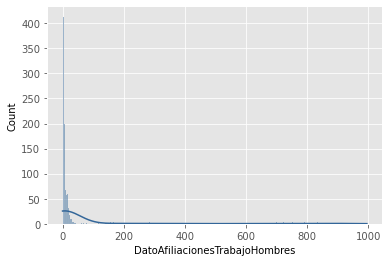

In [75]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoAfiliacionesTrabajoHombres", kde=True,  color="#336699")
plt.show()

In [76]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAfiliacionesTrabajoHombres'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAfiliacionesTrabajoHombres'].kurt()}")

Skewness: 2.79432261691516
Kurtosis: 6.549526431372763


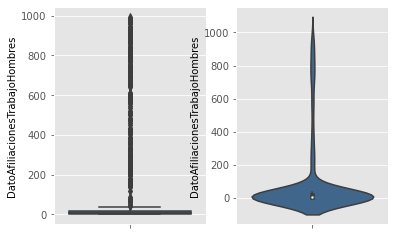

In [77]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoAfiliacionesTrabajoHombres",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoAfiliacionesTrabajoHombres", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoAfiliacionesTrabajoMujer

In [78]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesTrabajoMujer = df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesTrabajoMujer.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesTrabajoMujer.describe()

count    1674.000000
mean       81.895562
std       209.871987
min         0.000000
25%         2.596000
50%         5.674000
75%        15.489500
max       999.000000
Name: DatoAfiliacionesTrabajoMujer, dtype: float64

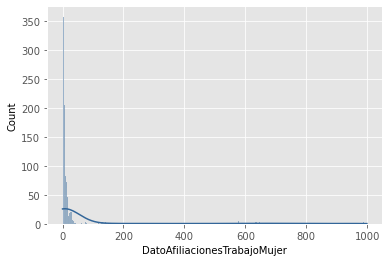

In [79]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoAfiliacionesTrabajoMujer", kde=True,  color="#336699")
plt.show()

In [80]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAfiliacionesTrabajoMujer'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAfiliacionesTrabajoMujer'].kurt()}")

Skewness: 2.8799395877013927
Kurtosis: 7.246929817443431


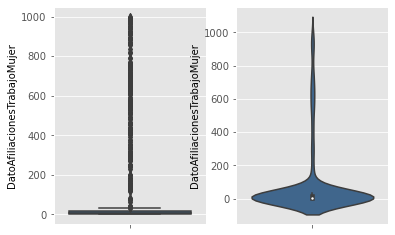

In [81]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoAfiliacionesTrabajoMujer",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoAfiliacionesTrabajoMujer", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoAfiliacionesResidencia

In [82]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesResidencia = df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesResidencia.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesResidencia.describe()

count     1288.000000
mean      9271.003882
std       5461.029538
min          0.000000
25%       5616.000000
50%       8413.000000
75%      12170.750000
max      35000.000000
Name: DatoAfiliacionesResidencia, dtype: float64

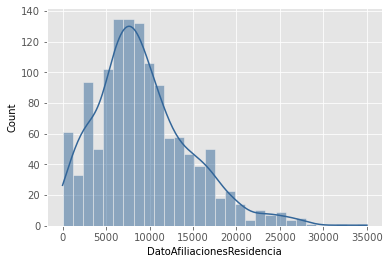

In [83]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoAfiliacionesResidencia", kde=True,  color="#336699")
plt.show()

In [84]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAfiliacionesResidencia'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAfiliacionesResidencia'].kurt()}")

Skewness: 0.868347021800091
Kurtosis: 0.9945514421303021


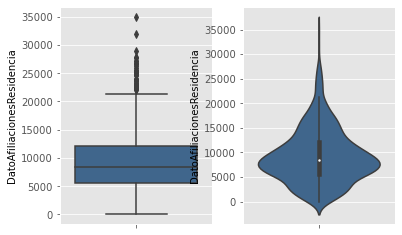

In [85]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoAfiliacionesResidencia",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoAfiliacionesResidencia", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoAfiliacionesResidenciaHombres

In [86]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesResidenciaHombres = df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesResidenciaHombres.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesResidenciaHombres.describe()

count    1282.000000
mean       34.178896
std       131.737472
min         0.000000
25%         2.993000
50%         4.375000
75%         6.716750
max       996.000000
Name: DatoAfiliacionesResidenciaHombres, dtype: float64

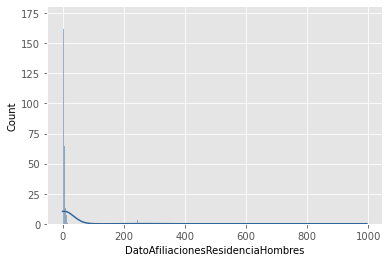

In [87]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoAfiliacionesResidenciaHombres", kde=True,  color="#336699")
plt.show()

In [88]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAfiliacionesResidenciaHombres'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAfiliacionesResidenciaHombres'].kurt()}")

Skewness: 5.199513085344987
Kurtosis: 28.893854457808096


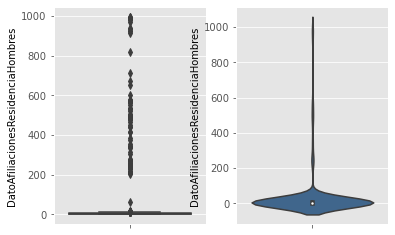

In [89]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoAfiliacionesResidenciaHombres",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoAfiliacionesResidenciaHombres", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoAfiliacionesResidenciaMujer

In [90]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesResidenciaMujer = df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesResidenciaMujer.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoAfiliacionesResidenciaMujer.describe()

count    1282.000000
mean       30.908327
std       117.661442
min         0.000000
25%         3.269250
50%         4.707000
75%         7.026250
max       997.000000
Name: DatoAfiliacionesResidenciaMujer, dtype: float64

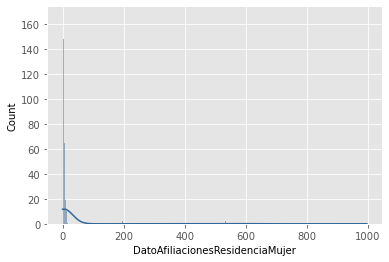

In [91]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoAfiliacionesResidenciaMujer", kde=True,  color="#336699")
plt.show()

In [92]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAfiliacionesResidenciaMujer'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAfiliacionesResidenciaMujer'].kurt()}")

Skewness: 5.20130665473322
Kurtosis: 29.39801021517484


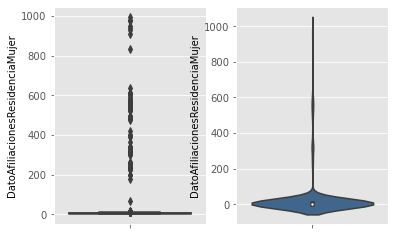

In [93]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoAfiliacionesResidenciaMujer",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoAfiliacionesResidenciaMujer", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoAutonomo

In [94]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoAutonomo = df_result_poblacion_economico_idealista_inversiones_locales.DatoAutonomo.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoAutonomo.describe()

count    1674.000000
mean     1103.549582
std       712.201406
min         0.000000
25%       523.500000
50%       994.000000
75%      1558.500000
max      4185.000000
Name: DatoAutonomo, dtype: float64

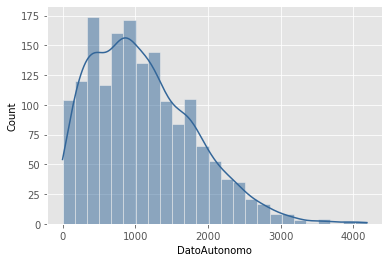

In [95]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoAutonomo", kde=True,  color="#336699")
plt.show()

In [96]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAutonomo'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAutonomo'].kurt()}")

Skewness: 0.7726494511359374
Kurtosis: 0.4682509061353626


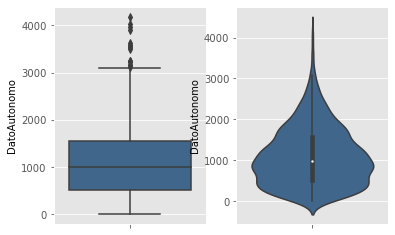

In [97]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoAutonomo",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoAutonomo", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoAutonomosHombres

In [98]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoAutonomosHombres = df_result_poblacion_economico_idealista_inversiones_locales.DatoAutonomosHombres.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoAutonomosHombres.describe()

count    1674.000000
mean      371.911665
std       316.128597
min         0.000000
25%         2.035000
50%       338.000000
75%       640.500000
max       996.000000
Name: DatoAutonomosHombres, dtype: float64

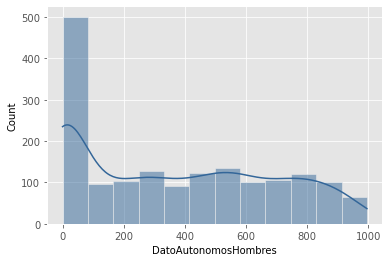

In [99]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoAutonomosHombres", kde=True,  color="#336699")
plt.show()

In [100]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAutonomosHombres'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAutonomosHombres'].kurt()}")

Skewness: 0.2718531098149471
Kurtosis: -1.2797266063939705


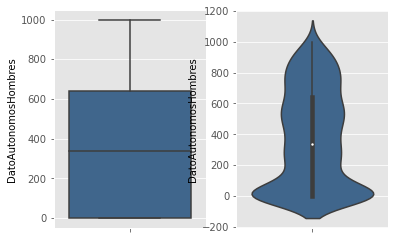

In [101]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoAutonomosHombres",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoAutonomosHombres", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### DatoAutonomosMujer

In [102]:
df_result_poblacion_economico_idealista_inversiones_locales.DatoAutonomosMujer = df_result_poblacion_economico_idealista_inversiones_locales.DatoAutonomosMujer.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.DatoAutonomosMujer.describe()

count    1674.000000
mean      365.777297
std       246.149682
min         0.000000
25%       166.250000
50%       329.000000
75%       523.750000
max       998.000000
Name: DatoAutonomosMujer, dtype: float64

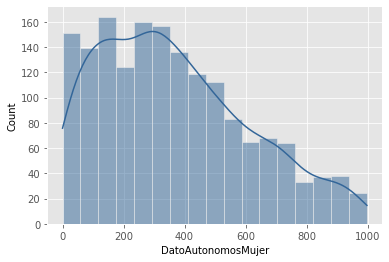

In [103]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="DatoAutonomosMujer", kde=True,  color="#336699")
plt.show()

In [104]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAutonomosMujer'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['DatoAutonomosMujer'].kurt()}")

Skewness: 0.5552646843612085
Kurtosis: -0.48217671951137575


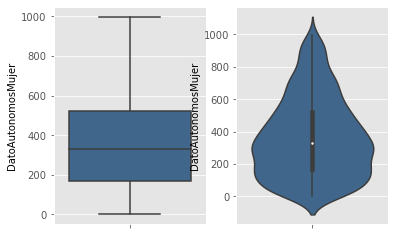

In [105]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "DatoAutonomosMujer",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "DatoAutonomosMujer", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### PrecioVentaEurosM2

In [106]:
df_result_poblacion_economico_idealista_inversiones_locales.PrecioVentaEurosM2 = df_result_poblacion_economico_idealista_inversiones_locales.PrecioVentaEurosM2.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.PrecioVentaEurosM2.describe()

count    2016.000000
mean        3.114661
std         1.038315
min         1.281000
25%         2.333000
50%         2.991000
75%         3.803000
max         6.633000
Name: PrecioVentaEurosM2, dtype: float64

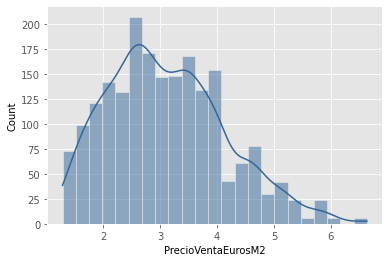

In [107]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="PrecioVentaEurosM2", kde=True,  color="#336699")
plt.show()

In [108]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['PrecioVentaEurosM2'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['PrecioVentaEurosM2'].kurt()}")

Skewness: 0.5305013582503456
Kurtosis: -0.0821733229113204


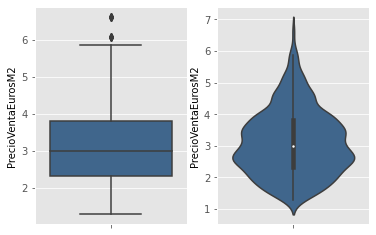

In [109]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "PrecioVentaEurosM2",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "PrecioVentaEurosM2", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### PresupuestoGasto

In [110]:
df_result_poblacion_economico_idealista_inversiones_locales.PresupuestoGasto = df_result_poblacion_economico_idealista_inversiones_locales.PresupuestoGasto.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.PresupuestoGasto.describe()

count    1.547000e+03
mean     2.230217e+07
std      1.779981e+07
min      1.336786e+06
25%      1.023173e+07
50%      1.843495e+07
75%      2.966988e+07
max      1.166014e+08
Name: PresupuestoGasto, dtype: float64

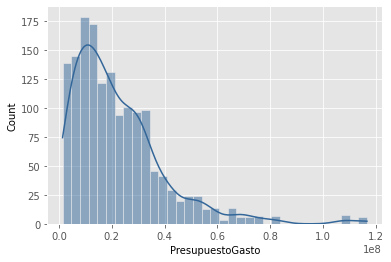

In [111]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="PresupuestoGasto", kde=True,  color="#336699")
plt.show()

In [112]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['PresupuestoGasto'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['PresupuestoGasto'].kurt()}")

Skewness: 1.8952346939222082
Kurtosis: 5.497021370697559


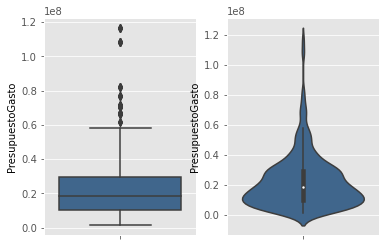

In [113]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "PresupuestoGasto",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "PresupuestoGasto", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### Gasto_Real

In [114]:
df_result_poblacion_economico_idealista_inversiones_locales.Gasto_Real = df_result_poblacion_economico_idealista_inversiones_locales.Gasto_Real.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.Gasto_Real.describe()

count    1.547000e+03
mean     1.367230e+07
std      1.287511e+07
min      1.272321e+06
25%      5.877625e+06
50%      1.012765e+07
75%      1.779712e+07
max      1.122716e+08
Name: Gasto_Real, dtype: float64

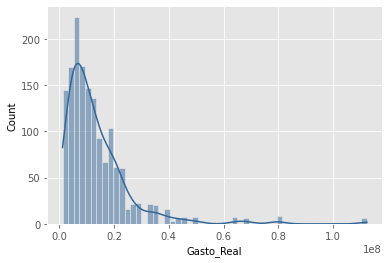

In [115]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="Gasto_Real", kde=True,  color="#336699")
plt.show()

In [116]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['Gasto_Real'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['Gasto_Real'].kurt()}")

Skewness: 3.3915859774800325
Kurtosis: 17.546216647802506


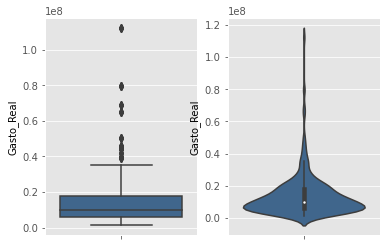

In [117]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "Gasto_Real",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "Gasto_Real", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### NumeroLocales

In [118]:
df_result_poblacion_economico_idealista_inversiones_locales.NumeroLocales = df_result_poblacion_economico_idealista_inversiones_locales.NumeroLocales.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.NumeroLocales.describe()

count     1029.000000
mean      1537.707483
std       1308.536903
min          4.000000
25%        564.000000
50%       1322.000000
75%       1932.000000
max      13343.000000
Name: NumeroLocales, dtype: float64

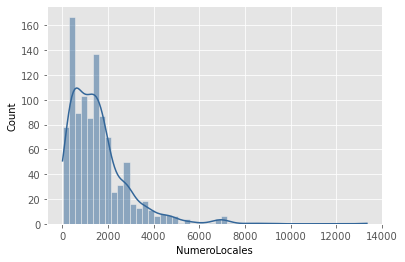

In [119]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="NumeroLocales", kde=True,  color="#336699")
plt.show()

In [120]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['NumeroLocales'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['NumeroLocales'].kurt()}")

Skewness: 2.3707098693473125
Kurtosis: 10.52193887695085


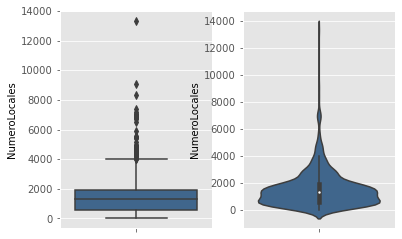

In [121]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "NumeroLocales",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "NumeroLocales", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

#### NumeroAlojamientos

In [122]:
df_result_poblacion_economico_idealista_inversiones_locales.NumeroAlojamientos = df_result_poblacion_economico_idealista_inversiones_locales.NumeroAlojamientos.astype(float)

df_result_poblacion_economico_idealista_inversiones_locales.NumeroAlojamientos.describe()

count    693.000000
mean       8.148629
std       10.831986
min        1.000000
25%        2.000000
50%        4.000000
75%        9.000000
max       76.000000
Name: NumeroAlojamientos, dtype: float64

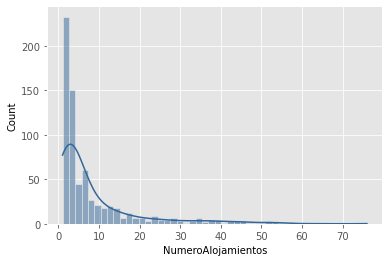

In [123]:
sns.histplot(data=df_result_poblacion_economico_idealista_inversiones_locales, x="NumeroAlojamientos", kde=True,  color="#336699")
plt.show()

In [124]:
print(f"Skewness: {df_result_poblacion_economico_idealista_inversiones_locales['NumeroAlojamientos'].skew()}")
print(f"Kurtosis: {df_result_poblacion_economico_idealista_inversiones_locales['NumeroAlojamientos'].kurt()}")

Skewness: 2.5726251202530603
Kurtosis: 7.316418185466637


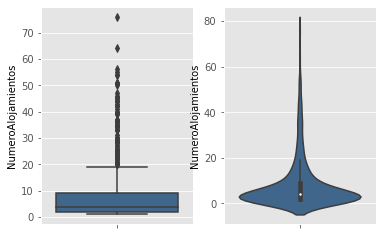

In [125]:
fig, axs = plt.subplots(ncols=2)

sns.boxplot(data=df_result_poblacion_economico_idealista_inversiones_locales, y = "NumeroAlojamientos",
            color = "#336699", ax=axs[0])

sns.violinplot(y = "NumeroAlojamientos", data = df_result_poblacion_economico_idealista_inversiones_locales, 
                color = "#336699", ax=axs[1]);

In [126]:
df_result_poblacion_economico_idealista_inversiones_locales.skew()

/tmp/ipykernel_58373/1167715044.py:1: FutureWarning: The default value of numeric_only in DataFrame.skew is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_result_poblacion_economico_idealista_inversiones_locales.skew()


Anio                                -0.016023
CodigoDistrito                       0.099742
CodigoBarrio                         0.091848
DatoPoblacion                        0.709259
DatoPoblacionMenor16                 1.340308
DatoPoblacionEntre16y64             -4.707332
DatoPoblacionMayor65                -0.416693
DatoSobreEnvejecimiento              0.106105
DatoSobreenvejecimientoHombres       0.064401
DatoSobreenvejecimientoMujeres       0.230260
DatoFeminidad                       -2.422045
DatoParadosRegistrados               1.292448
DatoParadosRegistradosHombres        0.452764
DatoParadosRegistradosMujer          0.359388
DatoAfiliacionesTrabajo              2.196183
DatoAfiliacionesTrabajoHombres       2.794323
DatoAfiliacionesTrabajoMujer         2.879940
DatoAfiliacionesResidencia           0.868347
DatoAfiliacionesResidenciaHombres    5.199513
DatoAfiliacionesResidenciaMujer      5.201307
DatoAutonomo                         0.772649
DatoAutonomosHombres              

In [127]:
df_result_poblacion_economico_idealista_inversiones_locales.kurt()

/tmp/ipykernel_58373/1538963341.py:1: FutureWarning: The default value of numeric_only in DataFrame.kurt is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_result_poblacion_economico_idealista_inversiones_locales.kurt()


Anio                                 -1.215173
CodigoDistrito                       -1.039547
CodigoBarrio                         -1.040562
DatoPoblacion                         0.481996
DatoPoblacionMenor16                  2.114804
DatoPoblacionEntre16y64              65.558523
DatoPoblacionMayor65                  0.642371
DatoSobreEnvejecimiento               1.275316
DatoSobreenvejecimientoHombres        0.571016
DatoSobreenvejecimientoMujeres        1.846049
DatoFeminidad                        28.021444
DatoParadosRegistrados                2.111410
DatoParadosRegistradosHombres        -0.921811
DatoParadosRegistradosMujer          -1.159289
DatoAfiliacionesTrabajo               6.522016
DatoAfiliacionesTrabajoHombres        6.549526
DatoAfiliacionesTrabajoMujer          7.246930
DatoAfiliacionesResidencia            0.994551
DatoAfiliacionesResidenciaHombres    28.893854
DatoAfiliacionesResidenciaMujer      29.398010
DatoAutonomo                          0.468251
DatoAutonomos

Con el estudio realizado se puede ver que existen multitud de 'outlayers" que deben ser estudiados. En el caso del dataset estudiado se ha visto que, pese a que los valores se consideran 'outlayers', son valores que se pueden considerar razonables. Es por esto que se decide dejar los valores ya que, precisamente, podrian ser de mucho valor a la hora de realizar el estudio que se quiere realizar.

Ademas, se analiza la asimetria de las variables mediante el estudio de la skewness que para datos grandes siempre arroja resultados similares a otros calculos.

El valor obtenido se puede interpretar de la siguiente manera:

- Si el valor de sesgo es menor que −1 o mayor que +1  la distribución será altamente sesgada.
- si el valor de asimetría está entre −1 y +1 diremos que la distribución es moderadamente sesgada.

De la misma manera, se estudia el valor de la Kurtosis, o Curtosis, que se utiliza para describir la forma de la distribucion. Si la distribución tienen valores extremos, la forma será mas puntiaguda, por lo que se conoce a esta medida como forma de apuntalamiento. 

La interpretación de esta medida sera:

- Si Kurtosis < 3 la distribucion se considera Platicúrtica.
- Si Kurtosis = 3 la distribucion se considera Mesocúrtica.
- Si Kurtosis > 3 la distribucion se considera Leptocúrtica. 

Con este estudio lo que se pretende es conocer una caracteristica mas de la distribución. Una distribución muy asimnetrica podria indicar mucha desigualdad en los valores o que el esfuerzo a la hora de estudiar la variable se pueda centrar en unos pocos valores pero que aportan mucha información.


### Estudio de correlaciones de las variables.

Por último, es muy interesante conocer la correlación que existe entre las diferentes varables del dataset. De esta manera se puede estudiar la influencia que puede tener una variable sobre otra.

Para realizar este estudio se utiliza el gráfico "pairplot" dentro de la libreria "seaborn"

In [128]:
df_result_poblacion_economico_idealista_inversiones_locales.corr()

/tmp/ipykernel_58373/1736283279.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_result_poblacion_economico_idealista_inversiones_locales.corr()


,Anio,CodigoDistrito,DatoPoblacion,DatoPoblacionMenor16,DatoPoblacionEntre16y64,DatoPoblacionMayor65,DatoSobreEnvejecimiento,DatoSobreenvejecimientoHombres,DatoSobreenvejecimientoMujeres,DatoFeminidad,...,DatoAfiliacionesResidenciaHombres,DatoAfiliacionesResidenciaMujer,DatoAutonomo,DatoAutonomosHombres,DatoAutonomosMujer,PrecioVentaEurosM2,PresupuestoGasto,Gasto_Real,NumeroLocales,NumeroAlojamientos
Anio,1.000000,0.016947,-0.005966,-0.032446,-0.134774,0.116173,0.355112,0.404458,0.324206,0.040293,...,-0.067456,-0.035209,0.155052,-0.063506,0.104820,0.047192,0.357916,0.194187,-0.028397,0.076040
CodigoDistrito,0.016947,1.000000,-0.009779,0.366285,-0.136485,-0.215893,-0.223717,-0.108532,-0.262185,-0.332601,...,0.010382,0.014107,-0.423362,-0.005118,-0.339674,-0.587755,-0.072804,-0.123033,-0.267645,-0.414989
DatoPoblacion,-0.005966,-0.009779,1.000000,-0.149026,0.069166,0.112499,-0.045773,-0.004068,-0.068473,0.015306,...,-0.315095,-0.314181,0.609689,0.111090,0.519756,-0.143430,0.031378,0.019405,0.568738,-0.068331
DatoPoblacionMenor16,-0.032446,0.366285,-0.149026,1.000000,0.028900,-0.706774,-0.222391,-0.276923,-0.163052,-0.291286,...,0.208769,0.180167,-0.409921,-0.026887,-0.308820,-0.267211,-0.032075,-0.068191,-0.316966,-0.424154
DatoPoblacionEntre16y64,-0.134774,-0.136485,0.069166,0.028900,1.000000,-0.423701,-0.026959,-0.123307,0.035874,-0.046122,...,-0.074113,-0.074648,0.190641,0.014855,0.038702,0.066591,0.154731,0.181221,0.326842,0.519874
DatoPoblacionMayor65,0.116173,-0.215893,0.112499,-0.706774,-0.423701,1.000000,0.324928,0.434280,0.232348,0.607423,...,-0.081668,-0.058563,0.223079,0.057035,0.272365,0.197770,-0.099740,-0.084610,-0.018328,-0.032924
DatoSobreEnvejecimiento,0.355112,-0.223717,-0.045773,-0.222391,-0.026959,0.324928,1.000000,0.934587,0.979743,0.391923,...,-0.095627,-0.096859,0.118915,0.007298,0.089000,0.014636,0.032126,0.032003,0.191494,-0.004138
DatoSobreenvejecimientoHombres,0.404458,-0.108532,-0.004068,-0.276923,-0.123307,0.434280,0.934587,1.000000,0.846771,0.383061,...,-0.111542,-0.091461,0.048963,0.035012,0.051858,-0.111233,-0.007669,-0.013057,0.125911,-0.161970
DatoSobreenvejecimientoMujeres,0.324206,-0.262185,-0.068473,-0.163052,0.035874,0.232348,0.979743,0.846771,1.000000,0.362876,...,-0.072238,-0.085413,0.140183,-0.008640,0.094268,0.070480,0.058312,0.057875,0.212387,0.077700
DatoFeminidad,0.040293,-0.332601,0.015306,-0.291286,-0.046122,0.607423,0.391923,0.383061,0.362876,1.000000,...,-0.081527,-0.085410,0.225212,0.092533,0.335247,0.357351,-0.173701,-0.147088,-0.102803,-0.284815


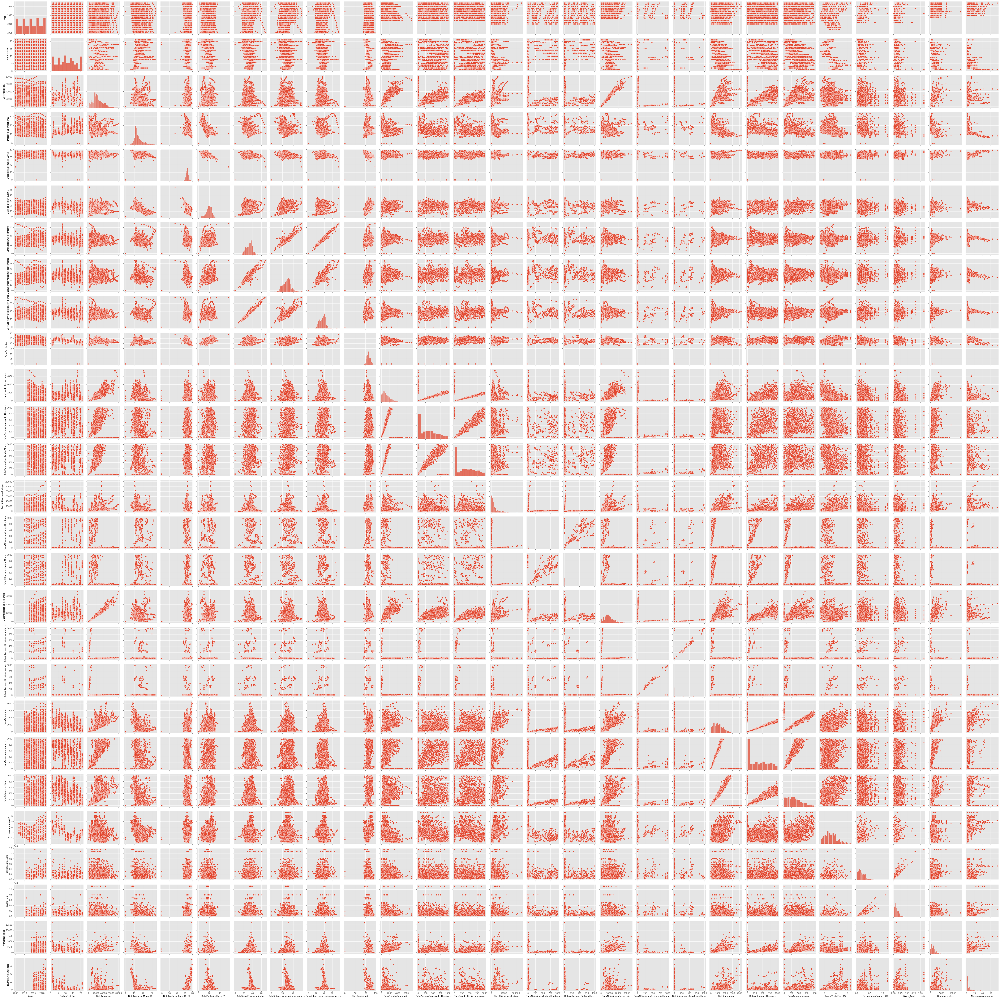

In [129]:
sns.pairplot(df_result_poblacion_economico_idealista_inversiones_locales)